<a href="https://colab.research.google.com/github/HasyimAP/SandBox/blob/main/photo_to_painting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import numpy as np
from google.colab import files
from google.colab.patches import cv2_imshow

In [2]:
def read_file(filename):
  img = cv2.imread(filename)
  cv2_imshow(img)
  return img

In [3]:
def edge_mask(img, line_size, blur_value):
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  gray_blur = cv2.medianBlur(gray, blur_value)
  edges = cv2.adaptiveThreshold(gray_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, line_size, blur_value)
  return edges


In [4]:
def color_quantization(img, k):
# Transform the image
  data = np.float32(img).reshape((-1, 3))

# Determine criteria
  criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 20, 0.001)

# Implementing K-Means
  ret, label, center = cv2.kmeans(data, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
  center = np.uint8(center)
  result = center[label.flatten()]
  result = result.reshape(img.shape)
  return result

Saving IMG20220425230911(2).jpg to IMG20220425230911(2).jpg


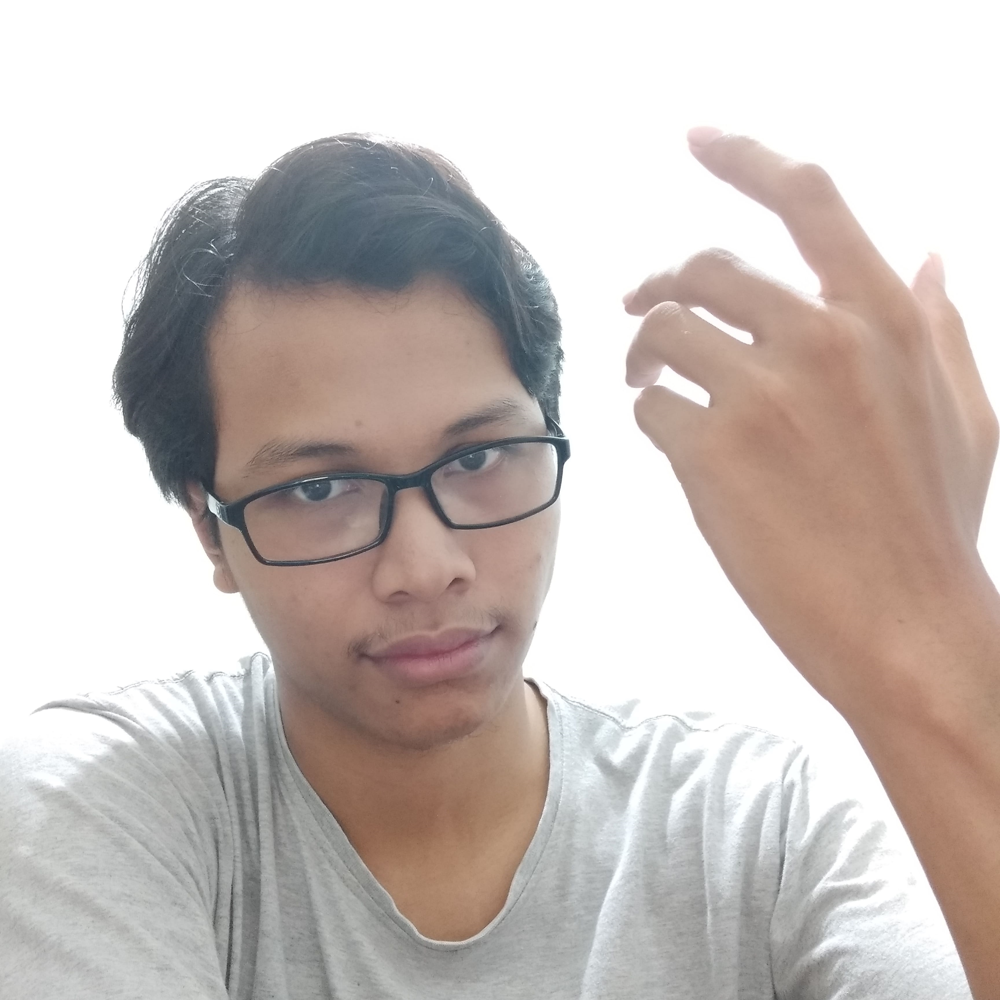

In [7]:
#upload image
uploaded = files.upload()
filename = next(iter(uploaded))
img = read_file(filename)

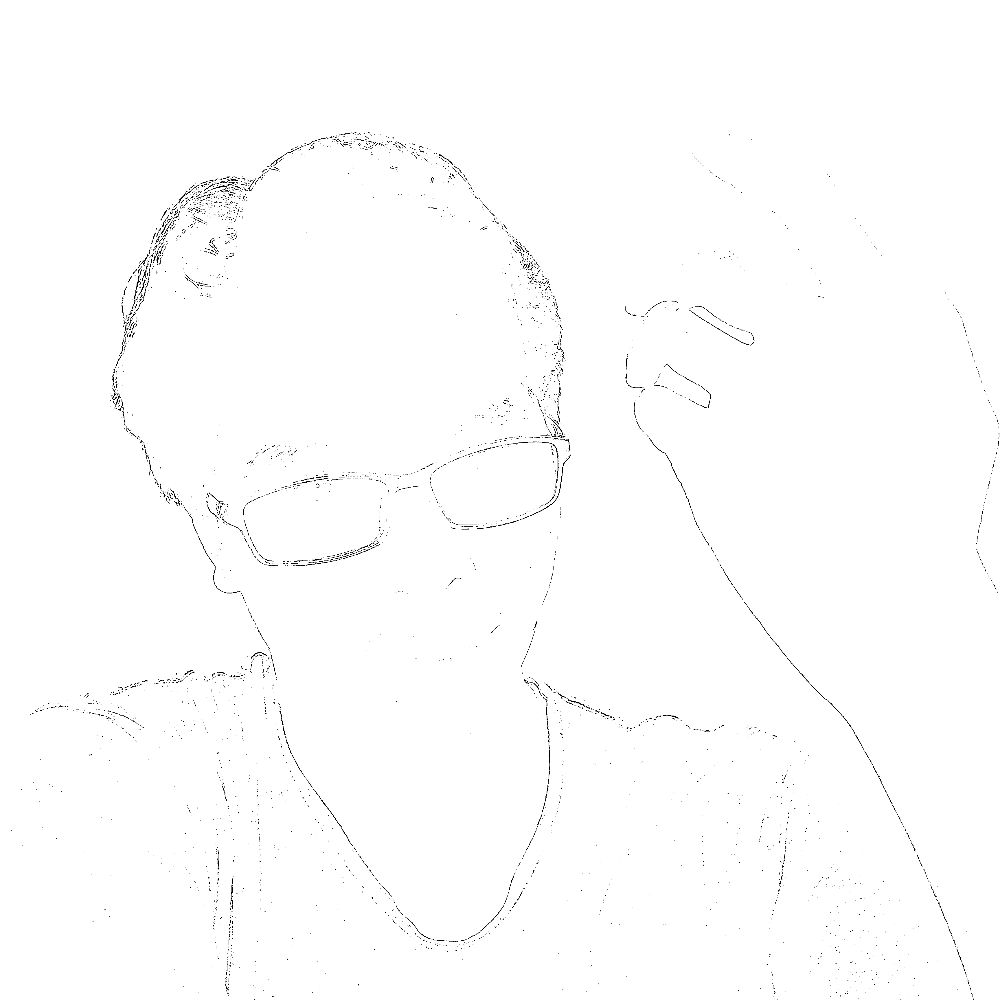

In [15]:
line_size = 5
blur_value = 5
edges = edge_mask(img, line_size, blur_value)
cv2_imshow(edges)

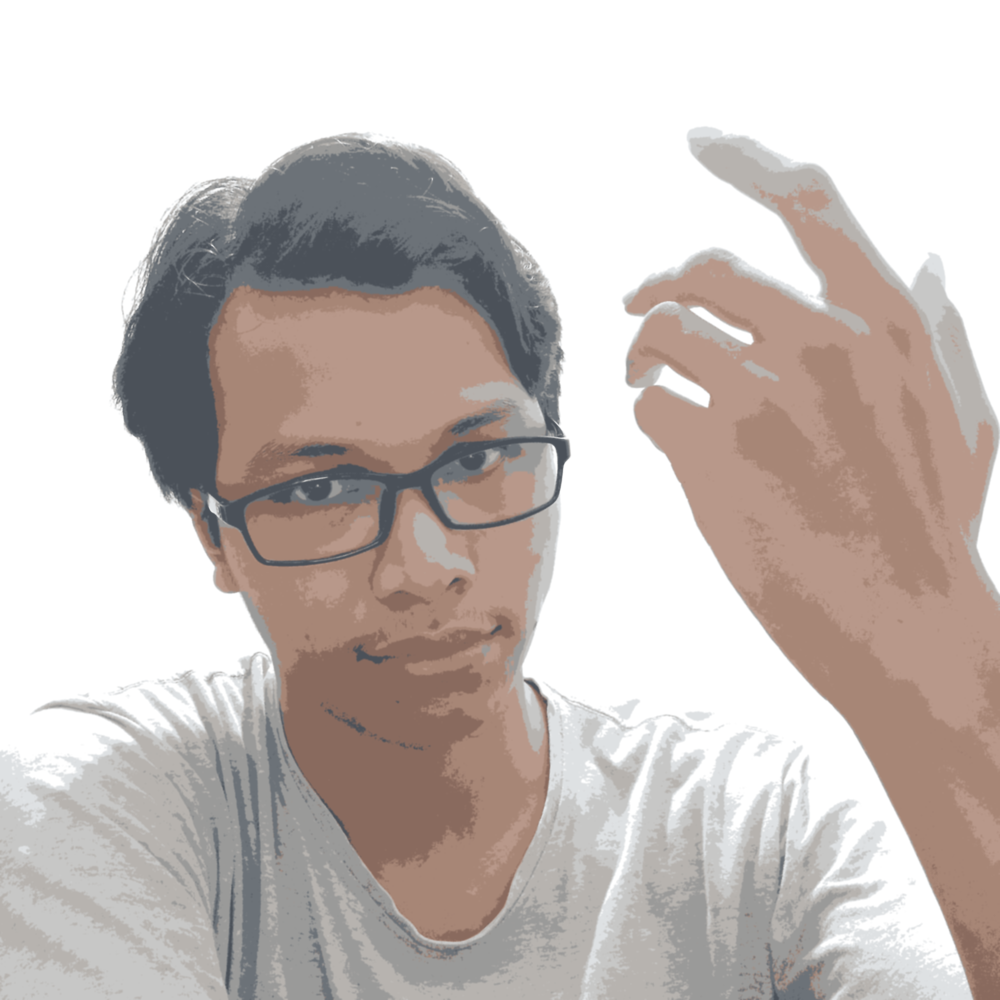

In [11]:
total_color = 10
quantized_img = color_quantization(img, total_color)
blurred = cv2.bilateralFilter(quantized_img, d=9, sigmaColor=250,sigmaSpace=250)
cv2_imshow(blurred)

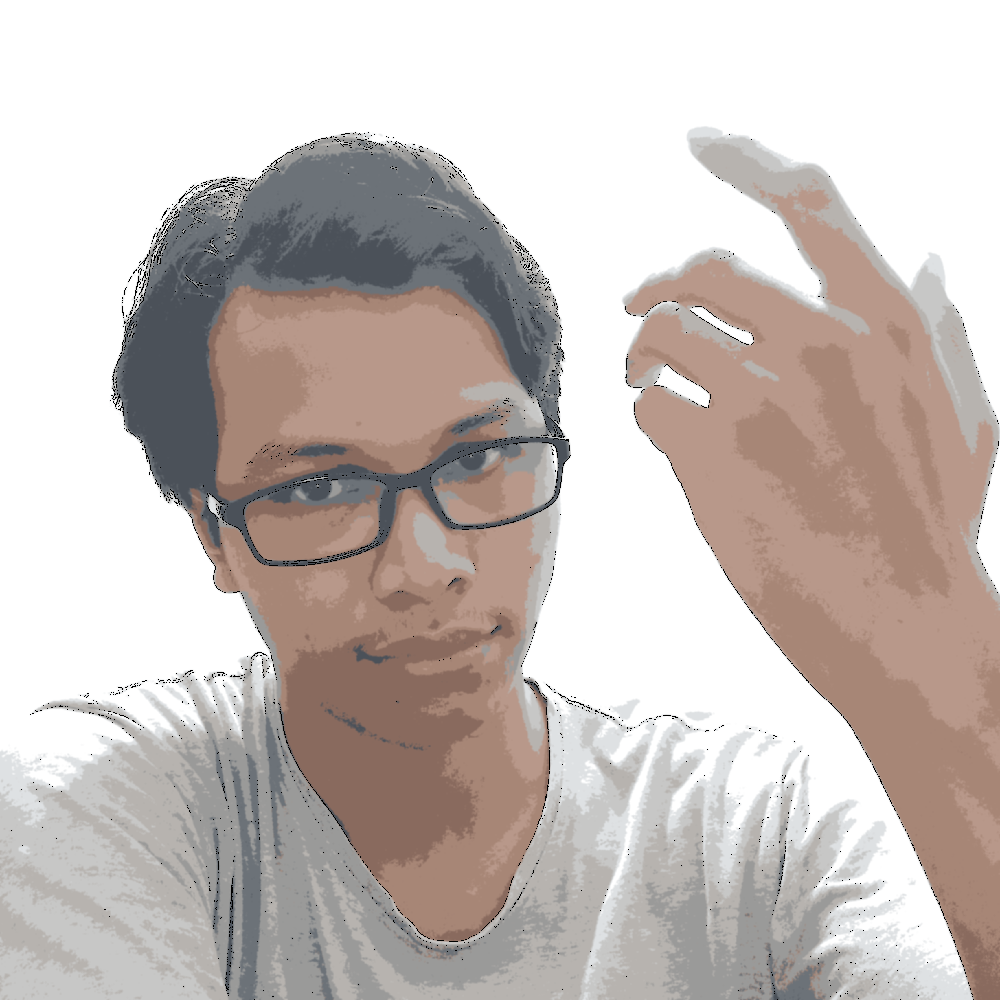

In [16]:
painting = cv2.bitwise_and(blurred, blurred, mask=edges)
cv2_imshow(painting)

<h2>Note</h2>

If you use a higher resolution picture it will take longer time to finish